# **Application of XAI methods on Cats and Dogs Classification image dataset**
  
  **Dataset**. The image dataset was chosen from the [provided source](https://xaidataset.github.io/dataset/) in project work slides. As stated in the overview section, this binary classification dataset consists of 7390 image files. And it's unbalanced. Our XAI methods (LIME, Vanilla, GradCam) will try to explain the basis for classifying an image as either a dog or a cat.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

zip_path = "/content/drive/MyDrive/image.zip"

import zipfile

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data/data')

Mounted at /content/drive


**Step 1**. First we installed and imported the libraries we need. The lime library will be used for LIME explanation method

In [2]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=b71cb7a6d412dae8b27546a9ac72f0a19ace30487c0dbc9e81110299874e25b2
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
import skimage.io
import skimage.segmentation

In [4]:
data_dir = r'/content/sample_data/data/image'

**Step 2**. We are using the tensorflow's Restnet50 model for our dataset which is commonly in use for image datasets. We started with dividing our dataset into train and validation sets with the proportion of 80/20% respectively. And some properties of image including height, width are provided. Two classes and some example images can be checked from the train dataset

In [5]:
img_height, img_width = 224, 224
batch_size = 32
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split = 0.2,
    subset = 'training',
    seed = 123,
    image_size = (img_height, img_width),
    batch_size = batch_size
)

Found 7390 files belonging to 2 classes.
Using 5912 files for training.


In [6]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split = 0.2,
    subset = 'validation',
    seed = 123,
    image_size = (img_height, img_width),
    batch_size = batch_size
)

Found 7390 files belonging to 2 classes.
Using 1478 files for validation.


In [7]:
class_names = train_ds.class_names
print(class_names)

['cat', 'dog']


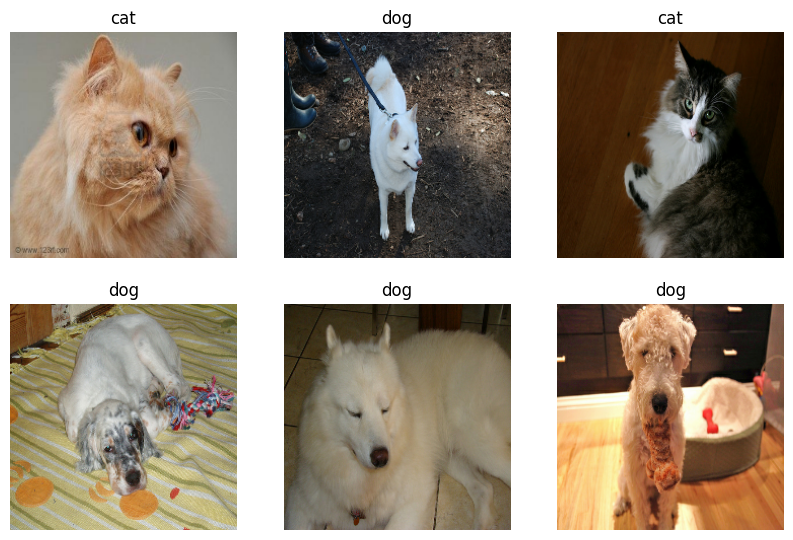

In [8]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(6):
    ax = plt.subplot(3, 3, i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

**Step 3**. After splitting our datsset into train/validation, we can now build our model for classification. As our model is pretrained on Imagenet dataset, it's a transfer learning architecture built on top of ResNet50 with some custom layers added. We're adding 2 neurons in output layer as we have a binary classification task.

One important point is the image shape should be consistent through the model and all XAI methods!

In [9]:
# input_tensor = Input(shape=(224, 224, 3))
# base_model = ResNet50(include_top=False, weights="imagenet", input_tensor=input_tensor, pooling='avg')

# for layer in base_model.layers:
#     layer.trainable = False

# x = base_model.output
# x = Flatten()(x)
# x = Dense(512, activation='relu')(x)
# output_tensor = Dense(2, activation='softmax')(x)

# resnet_model = Model(inputs=input_tensor, outputs=output_tensor)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [10]:
# resnet_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,637,826 (93.99 MB)

 Trainable params: 1,050,114 (4.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)


It can be noticed that altough a total number of parametrs is 24,637,826, only 1,050,114 among them can be trained while others are non-trainable parametrs.

And for training the parametrs we used Adam optimizer, and Crossentropy loss function:

In [11]:
# resnet_model.compile(optimizer=Adam(learning_rate=0.001),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [12]:
# epochs=4
# history = resnet_model.fit(
#   train_ds,
#   validation_data=val_ds,
#   epochs=epochs
# )

Epoch 1/4
185/185 ━━━━━━━━━━━━━━━━━━━━ 1548s 8s/step - accuracy: 0.9081 - loss: 0.4433 - val_accuracy: 0.9594 - val_loss: 0.1056
Epoch 2/4
185/185 ━━━━━━━━━━━━━━━━━━━━ 1510s 8s/step - accuracy: 0.9813 - loss: 0.0504 - val_accuracy: 0.9811 - val_loss: 0.0414
Epoch 3/4
185/185 ━━━━━━━━━━━━━━━━━━━━ 1512s 8s/step - accuracy: 0.9930 - loss: 0.0237 - val_accuracy: 0.9878 - val_loss: 0.0316
Epoch 4/4
185/185 ━━━━━━━━━━━━━━━━━━━━ 1499s 8s/step - accuracy: 0.9954 - loss: 0.0148 - val_accuracy: 0.9804 - val_loss: 0.0511


4 epochs were enough to get **98% accuracy** in our Validation dataset

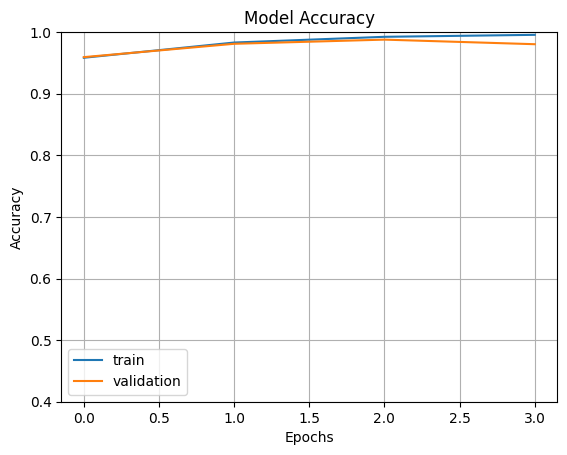

In [13]:
# fig1 = plt.gcf()
# plt.plot(history.history['accuracy'])
# plt.plot(history.history['val_accuracy'])
# plt.axis(ymin=0.4,ymax=1)
# plt.grid()
# plt.title('Model Accuracy')
# plt.ylabel('Accuracy')
# plt.xlabel('Epochs')
# plt.legend(['train', 'validation'])
# plt.show()

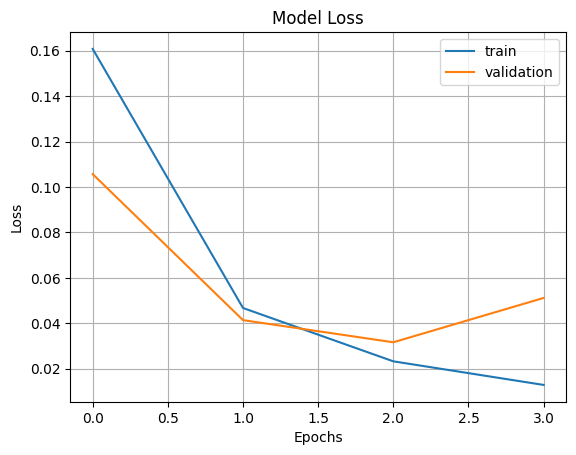

In [14]:
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.grid()
# plt.title('Model Loss')
# plt.ylabel('Loss')
# plt.xlabel('Epochs')
# plt.legend(['train', 'validation'])
# plt.show()

It's shown in plots how model accuracy is slightly improving and loss function is noticably decreasing through each iteration

**Step 4.** The trained model is saved for the later usage. But it's still important to update our [validation dataset](https://colab.research.google.com/drive/171ZxbOo82jgGsRhi22btmcbe2Jgc6LVK#scrollTo=oE2GkOf8XxYl&line=1&uniqifier=1) in order to use it for new predictions.

In [15]:
# resnet_model.save('resnet_model.h5')

In [16]:
resnet_model = tf.keras.models.load_model('/content/resnet_model.h5')

**Step 5.** Model's predictions for some random images from each class can be checked. And our XAI methods will be based on the result of these predictions.

Image 1: Label = Dog | Shape: (224, 224, 3)
Image 2: Label = Cat | Shape: (224, 224, 3)
Image 3: Label = Dog | Shape: (224, 224, 3)
Image 4: Label = Cat | Shape: (224, 224, 3)
Image 5: Label = Dog | Shape: (224, 224, 3)
Image 6: Label = Cat | Shape: (224, 224, 3)


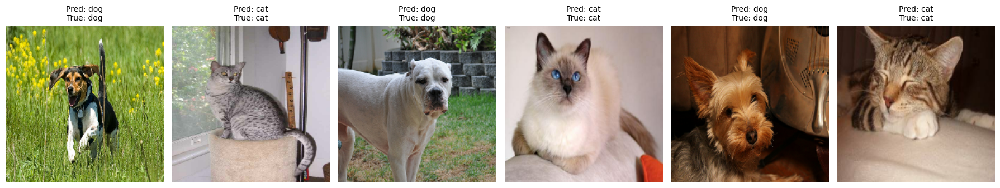

In [17]:
import random
val_list = list(val_ds.unbatch())

cat_images = [(img, lbl) for img, lbl in val_list if lbl.numpy() == 0]
dog_images = [(img, lbl) for img, lbl in val_list if lbl.numpy() == 1]

selected_cats = random.sample(cat_images, 3)
selected_dogs = random.sample(dog_images, 3)

selected_images = selected_cats + selected_dogs
random.shuffle(selected_images)

for i, (image, label) in enumerate(selected_images):
    print(f"Image {i+1}: Label = {'Cat' if label.numpy() == 0 else 'Dog'} | Shape: {image.shape}")

fig, axes = plt.subplots(1, 6, figsize=(18, 4))
for idx, (image, label) in enumerate(selected_images):
    image_batch = tf.expand_dims(image, axis=0)
    pred = resnet_model.predict(image_batch, verbose=0)
    output_class = np.argmax(pred, axis=1)[0]

    axes[idx].imshow(image.numpy().astype("uint8"))
    axes[idx].set_title(
        f"Pred: {class_names[output_class]}\nTrue: {class_names[label.numpy()]}", fontsize=10
    )
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

**Step 6.** In the last preprocessing section we convert the image from a TensorFlow tensor to a NumPy array, then verify if pixel values are in the 0–255 range. If so, it scales them to 0–1 as expected by the model. It's important because:


*   ResNet50 expects input pixel values in the range [0, 1]. Feeding unnormalized data (e.g., 0–255) can lead to incorrect predictions

*   Prevents unexpected behavior during inference or visualization caused by out-of-range pixel values
*   Ensures all images are on the same scale, which improves model stability and accuracy.



In [18]:
for i, (image, label) in enumerate(selected_images):
    image_np = image.numpy()
    if image_np.max() > 1.0:
        image_np = image_np / 255.0
    print(image_np.shape, image_np.dtype, image_np.max())

(224, 224, 3) float32 1.0
(224, 224, 3) float32 1.0
(224, 224, 3) float32 1.0
(224, 224, 3) float32 1.0
(224, 224, 3) float32 1.0
(224, 224, 3) float32 0.9847426


**Step 7.** We started our XAI methods with LIME technique to understand which regions of an image influence the model’s classification decision.

*   A ***classifier_fn*** is defined to preprocess images and return predictions from the trained ResNet50 model
*   Image segmentation is done using the ***slic algorithm*** for superpixel generation
*   Each image is passed to the ***LimeImageExplainer*** to generate an explanation. The explanation highlights regions (superpixels) most important (10 features in this case) for the predicted class

  0%|          | 0/1000 [00:00<?, ?it/s]

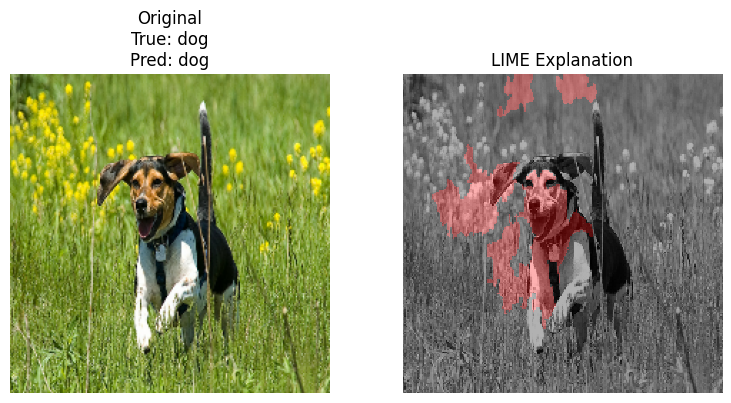

  0%|          | 0/1000 [00:00<?, ?it/s]

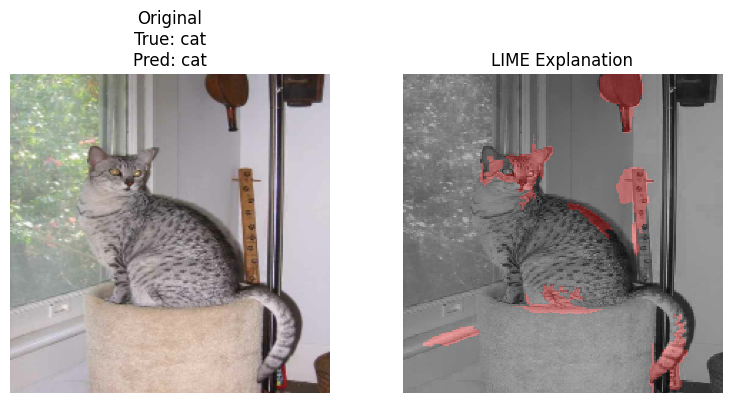

  0%|          | 0/1000 [00:00<?, ?it/s]

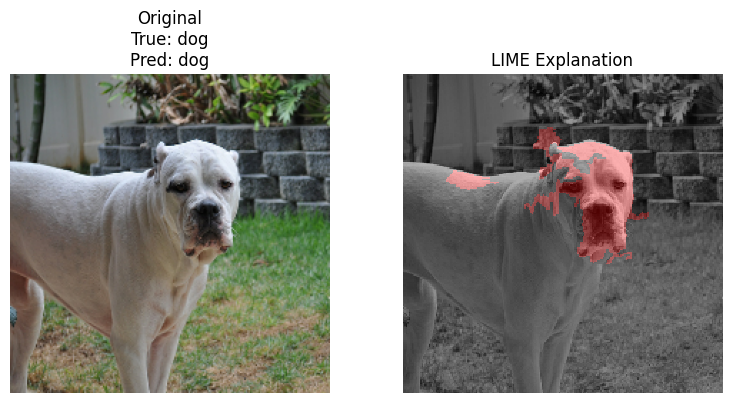

  0%|          | 0/1000 [00:00<?, ?it/s]

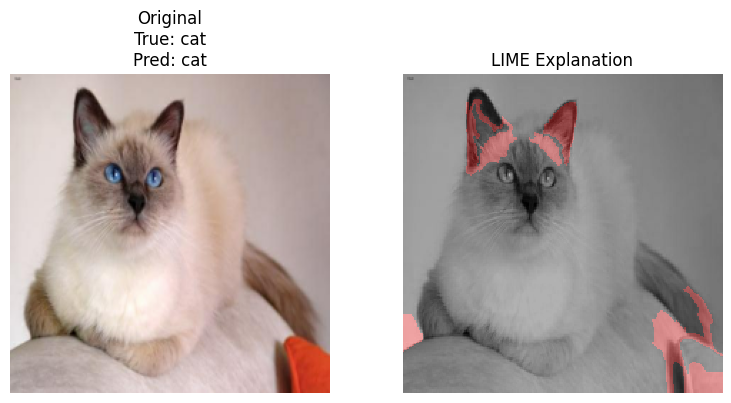

  0%|          | 0/1000 [00:00<?, ?it/s]

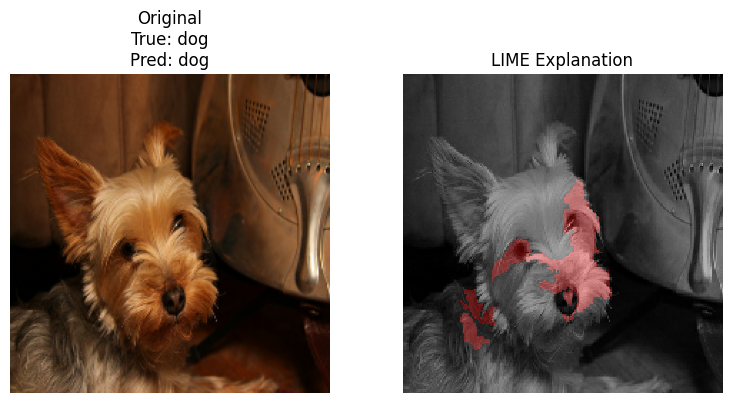

  0%|          | 0/1000 [00:00<?, ?it/s]

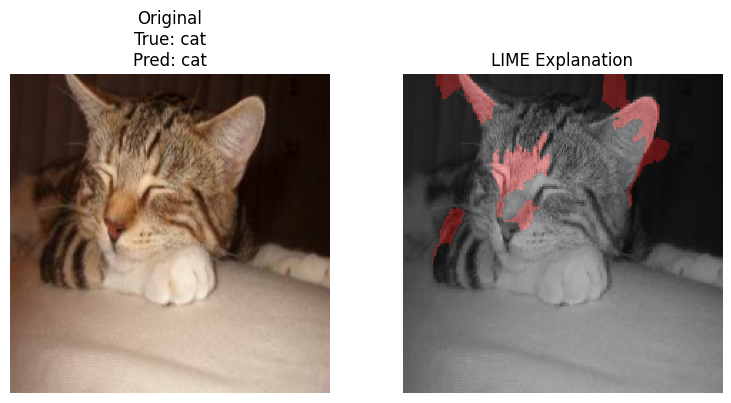

In [19]:
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm
from skimage.color import label2rgb
from skimage.segmentation import slic

explainer = lime_image.LimeImageExplainer(verbose=False)

def classifier_fn(images):
    images = np.array([tf.image.resize(img, (224, 224)) for img in images])
    images = tf.keras.applications.resnet50.preprocess_input(images)
    images = tf.convert_to_tensor(images)
    preds = resnet_model.predict(images, verbose=0)
    return preds

segmenter = lambda x: slic(x, n_segments=200, compactness=5, sigma=1)

for idx, (image, label) in enumerate(selected_images):
    image_np1 = image.numpy().astype("uint8")
    image_batch = tf.expand_dims(image, axis=0)

    pred = resnet_model.predict(image_batch, verbose=0)
    output_class = np.argmax(pred, axis=1)[0]

    explanation = explainer.explain_instance(
        image_np1,
        classifier_fn=classifier_fn,
        top_labels=5,
        hide_color=0,
        num_samples=1000,
        segmentation_fn=segmenter
    )

    temp, mask = explanation.get_image_and_mask(output_class, num_features=10, hide_rest=False)

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(image_np1)
    axes[0].set_title(f"Original\nTrue: {class_names[label.numpy()]}\nPred: {class_names[output_class]}")
    axes[0].axis('off')

    axes[1].imshow(label2rgb(mask, temp, bg_label=0), interpolation='none')
    axes[1].set_title("LIME Explanation")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()


**Observation**: In the left: The original image with predicted and true labels. In the Right: An overlaid LIME mask showing the most influential regions for the prediction.

For dogs the model primarily focuses on *the nose, forehead, neck* and surrounding region while for cats the area below the *Ears, whiskers and tail* are emphasized.

**Step 8.** Now we implement GradientTape class from Tensorflow for explanation of the model's prediction using **Vanilla Saliency Map**

For each selected image, we:

*   Predict its class with the trained resnet_model.
*   Use tf.GradientTape() to compute the gradient of the output class score with respect to each input pixel
*  Take the maximum absolute gradient across RGB channels to generate a 2D saliency map.

In [20]:
def vanilla_saliency_map(model, image, class_idx=None):
    image = tf.convert_to_tensor(image)
    image = tf.expand_dims(image, axis=0)

    with tf.GradientTape() as tape:
        tape.watch(image)
        predictions = model(image)
        if class_idx is None:
            class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    gradients = tape.gradient(loss, image)[0]
    saliency = tf.reduce_max(tf.abs(gradients), axis=-1)

    return saliency.numpy(), class_idx

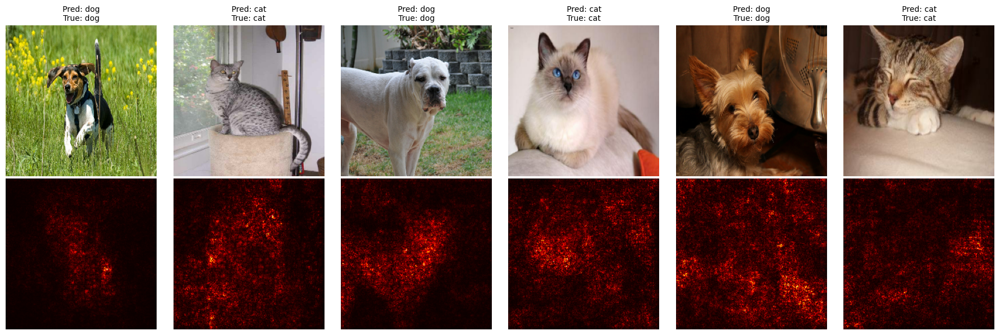

In [21]:
fig, axes = plt.subplots(2, 6, figsize=(18, 6))

for idx, (image, label) in enumerate(selected_images):
    image_batch = tf.expand_dims(image, axis=0)
    pred = resnet_model.predict(image_batch, verbose=0)
    output_class = np.argmax(pred, axis=1)[0]

    saliency_map, _ = vanilla_saliency_map(resnet_model, image, class_idx=output_class)

    axes[0, idx].imshow(image.numpy().astype("uint8"))
    axes[0, idx].set_title(
        f"Pred: {class_names[output_class]}\nTrue: {class_names[label.numpy()]}", fontsize=10
    )
    axes[0, idx].axis("off")

    axes[1, idx].imshow(saliency_map, cmap='hot')
    axes[1, idx].axis("off")

plt.tight_layout()
plt.show()

**Observation:** The saliency maps highlight important regions of the image like dog's nose and cat's head that influence the model’s prediction. It's also understandable for human interpration. However, some noisy parts are also observed — especially when the main object’s color is similar to the background, making it harder for the gradients to isolate distinct features

**Step 9.** And finally to implement Grad-CAM method we followed these steps:

*   Create sub-model() Outputs activations from the last conv layer and final predictions
*   Use GradientTape that tracks input to compute gradient of the target class score w.r.t. conv layer output
*   Generate class activation map (CAM): Weighted sum of feature maps, followed by ReLU
*   Normalize and resize CAM: Scale to [0, 1], resize to input image size (224×224).

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


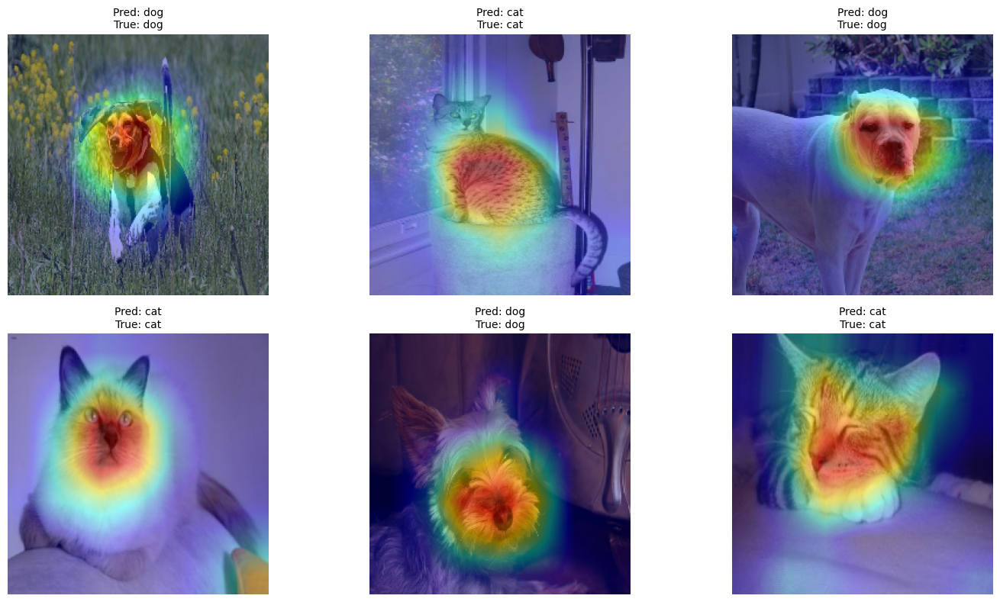

In [22]:
import cv2

def compute_gradcam(model, image, class_idx, layer_name):
    grad_model = Model(
        inputs=model.inputs,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        inputs = tf.cast(tf.expand_dims(image, axis=0), tf.float32)
        conv_outputs, predictions = grad_model(inputs)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)[0]
    conv_outputs = conv_outputs[0]

    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.zeros(conv_outputs.shape[:2], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * conv_outputs[:, :, i]

    cam = np.maximum(cam, 0)
    cam = cam / (cam.max() + 1e-8)
    cam = cv2.resize(cam, (224, 224))

    return cam

last_conv_layer_name = "conv5_block3_out"

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

for idx, (image, label) in enumerate(selected_images):
    image_uint8 = image.numpy().astype("uint8")
    image_resized = tf.image.resize(image_uint8, (224, 224))
    input_image = tf.keras.applications.resnet50.preprocess_input(image_resized)

    pred = resnet_model.predict(tf.expand_dims(input_image, axis=0), verbose=0)
    output_class = np.argmax(pred[0])
    class_name = class_names[output_class]

    heatmap = compute_gradcam(resnet_model, input_image, output_class, last_conv_layer_name)

    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(image_resized.numpy().astype("uint8"), 0.6, heatmap_color, 0.4, 0)

    ax = axes[idx // 3, idx % 3]
    ax.imshow(overlay)
    ax.set_title(f"Pred: {class_name}\nTrue: {class_names[label.numpy()]}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()


**Observation:** It's emphasising on mostly important parts such as whiskers, striped body parts in cats and nose, mouth, and head area in dogs. The explanatory parts on both classes are similar to each other but in more human-interpretable form at the same time

**Step 10.** **Comparison of Methods**

  0%|          | 0/1000 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


  0%|          | 0/1000 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


  0%|          | 0/1000 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


  0%|          | 0/1000 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


  0%|          | 0/1000 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


  0%|          | 0/1000 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


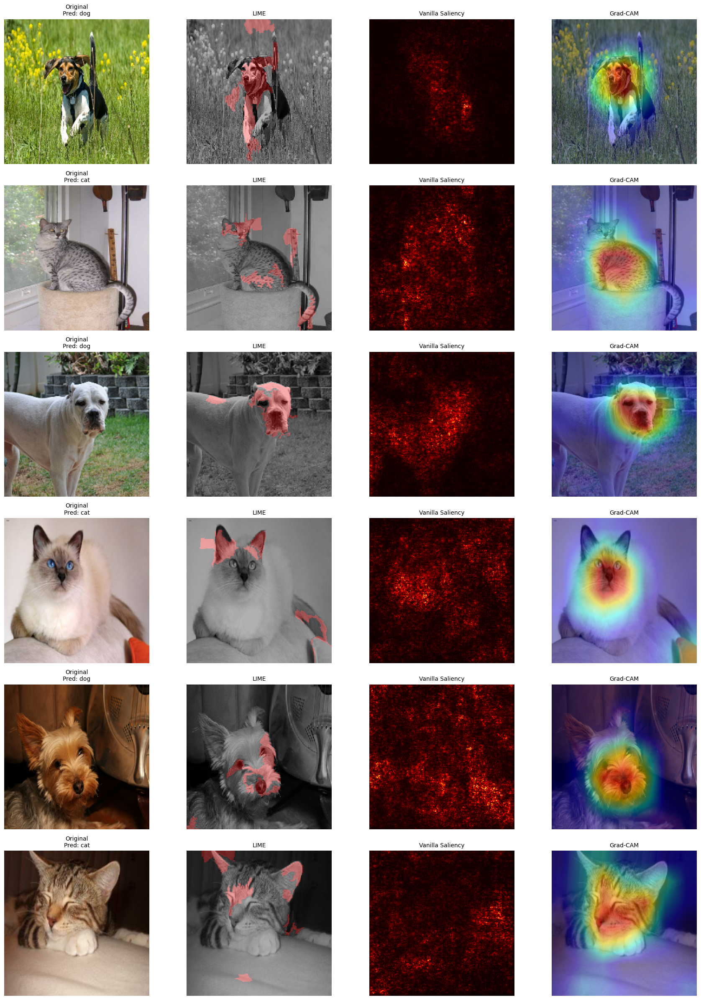

In [23]:
fig, axes = plt.subplots(6, 4, figsize=(18, 24))

for idx, (image, label) in enumerate(selected_images):

    image_uint8 = image.numpy().astype("uint8")
    image_resized = tf.image.resize(image_uint8, (224, 224))
    input_image = tf.keras.applications.resnet50.preprocess_input(image_resized)
    input_tensor = tf.expand_dims(input_image, axis=0)

    pred = resnet_model.predict(input_tensor, verbose=0)
    output_class = np.argmax(pred[0])
    class_name = class_names[output_class]

    axes[idx, 0].imshow(image_uint8)
    axes[idx, 0].set_title(f"Original\nPred: {class_name}", fontsize=10)
    axes[idx, 0].axis("off")

    explanation = explainer.explain_instance(
        image_uint8,
        classifier_fn=classifier_fn,
        top_labels=5,
        hide_color=0,
        num_samples=1000,
        segmentation_fn=segmenter
    )
    temp, mask = explanation.get_image_and_mask(output_class, num_features=10, hide_rest=False)
    axes[idx, 1].imshow(label2rgb(mask, temp, bg_label=0), interpolation='none')
    axes[idx, 1].set_title("LIME", fontsize=10)
    axes[idx, 1].axis("off")

    saliency_map, _ = vanilla_saliency_map(resnet_model, image, class_idx=output_class)
    axes[idx, 2].imshow(saliency_map, cmap='hot')
    axes[idx, 2].set_title("Vanilla Saliency", fontsize=10)
    axes[idx, 2].axis("off")

    heatmap = compute_gradcam(resnet_model, input_image, output_class, last_conv_layer_name)
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(image_resized.numpy().astype("uint8"), 0.6, heatmap_color, 0.4, 0)
    axes[idx, 3].imshow(overlay)
    axes[idx, 3].set_title("Grad-CAM", fontsize=10)
    axes[idx, 3].axis("off")

plt.tight_layout()
plt.show()


**Conclusion:**

Out of 3 XAI methods Grad-CAM looks more promising. Here's some reasons:


*   *Localized Attention:* Clearly highlights the discriminative regions (face or body of the pet), making the model’s reasoning intuitive

*   *Human-Interpretable Heatmaps:* It generated smooth, colorful overlays that are easy to understand, even for non-technical audiences

*   *Consistent Across Samples:* Unlike LIME and saliency, Grad-CAM is less sensetive to the noise
*   *Model aware:* Grad-CAM uses internal convolutional feature maps and gradients, making it more faithful to our actual prediction model


**References:**


*   For the classifiaction model RestNet50 this [github](https://github.com/nachi-hebbar/Transfer-Learning-ResNet-Keras) repository is used
*   Weekly exercises from XAI course
*   TensorFlow Developers. An end-to-end open-source machine learning platform.
 [Website](https://www.tensorflow.org/)
*   Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization.
Proceedings of the IEEE International Conference on Computer Vision (ICCV).
[[Paper Link]](https://arxiv.org/abs/1610.02391)



